## GEEO Level-2 and Level-3 routines

In the following we illustrate the usage of the core steps and routines in GEEO, including defining the processing instructions for your given task, running the processing pipeline and visualizing results (if not too expensive computationally).

### 1. Processing Instructions

GEEO routines are broadly categorized in level-2 and level-3 routines (level-4 for future releases). 

Level-2 builds upon level-2 (surface reflectance) optical imagery from Landsat and Sentinel-2, thus geometrically and radiometrically consistent image products. Further level-2 instructions given by the user extent the level-2 baseline via spatio-temporal filtering, scaling, harmonized naming, quality control (including cloud masking), resampling, additional index / feature calculation, mosacking, as well as spectral unmixing. 

Level-3 routines mainly encompass feature generation for time series data, namely advanced interpolation, metric calculation ('reducing' in GEE terms), and compositing. 

For a graphical overview of the GEEO routines see here:

![](../geeo/data/fig/geeo_workflow.drawio.svg)

In order to run the processing pipeline (or parts thereof) the user has two options for defining the instructions, either using ... 

1. a **.yml-parameter file**, or 
2. a **Python dictionary**.

#### 1.1 Parameter file approach

The parameter file approach uses a blueprint .yml-file as baseline from which the user can adjust the processing routines according to the specific needs.

Once we have imported geeo, we can create a new parameter file by using the `create_parameter_file` function:

In [1]:
# first import ee and geeo
import ee
ee.Authenticate()  # authenticate if necessary
ee.Initialize()
import geeo

# create new .yml-parameter file at specified location (here in current working directory)
geeo.create_parameter_file('example-parameter-file', overwrite=True)

Parameter file created: example-parameter-file.yml


Open and take a look at the output file *example-parameter-file.yml*. Each parameter file is structured broadly into Level-2 and Level-3 processing, each containing the following sub-categories:

LEVEL-2
- SPACE AND TIME
- SENSOR AND DATA QUALITY SETTINGS
- BANDS | INDICES | FEATURES
- LINEAR UNMIXING
- TIME SERIES MOSAIC (TSM)
- GENERAL OUTPUT AND PROJECTION SETTINGS

LEVEL-3
- TEMPORAL SUBWINDOWS | FOLDING
- TIME SERIES INTERPOLATION (TSI)
- SPECTRAL TEMPORAL METRICS (STM)
- PIXEL-BASED COMPOSITING (PBC)
- TREND ANALYSIS

As you can imagine, some of the settings are fundamental settings as such that the user must or should specify these for each new analysis, including spatial (study area) and temporal (time window) settings, sensor and quality settings (which sensor(s)?, what to mask / filter?), which bands and indices to include, and how to output the results (pixel size, data type, etc.). 

Other settings are optional as such as they are only adjusted if these outputs are needed for other routines or desired as output.  

For our first example we will leave everything at default settings. As you can see, the parameter file has a region-of-interest (ROI) specified by default covering Berlin [12.9, 52.2, 13.9, 52.7]. Also we include all data from 2023 from Landsat-4 to -9 (in practise this translates to L7-L9) with a maximum cloud cover of 75%, and with masking Landsat conservatively when there is medium confidence in cloud, cloud shadow, and snow detection (as well as fill values and dilated clouds). Furthermore, we only include the 'standard' six bands blue, green, red, nir, sw1 and sw2. We ignore the rest for now, you will see we will have only a single ee.ImageCollections as output. 

Now we can easily run the `level2` and `level3` routines, a) either using `run_param`, or b) separate for each processing level (`run_level2` / `run_level3`). For convinience, you can simply use the first approach:

In [5]:
from geeo import run_param, run_level2, run_level3, run_export

# run all instructed processing routines at once (level-2, level-3, export)
processed = run_param('example-parameter-file.yml')

# alternatively, run each processing routine separately
lvl2 = run_level2('example-parameter-file.yml')
lvl3 = run_level3(lvl2)  # input to level-3 is the output of level-2
processed = run_export(lvl3)  # input to export is the output of level-3
processed

{'ROI': [12.9, 52.2, 13.9, 52.7],
 'YEAR_MIN': 2023,
 'YEAR_MAX': 2023,
 'MONTH_MIN': 1,
 'MONTH_MAX': 12,
 'DOY_MIN': 1,
 'DOY_MAX': 366,
 'DATE_MIN': None,
 'DATE_MAX': None,
 'SENSORS': ['L9', 'L8', 'L7', 'L5', 'L4'],
 'EXCLUDE_SLCOFF': False,
 'GCP_MIN_LANDSAT': 1,
 'MAX_CLOUD': 75,
 'MASKS_LANDSAT': ['cloud', 'cshadow', 'snow', 'fill', 'dilated'],
 'MASKS_LANDSAT_CONF': 'Medium',
 'MASKS_S2': 'CPLUS',
 'MASKS_S2_CPLUS': 0.6,
 'MASKS_S2_PROB': 30,
 'MASKS_S2_NIR_THRESH_SHADOW': 0.2,
 'ERODE_DILATE': False,
 'ERODE_RADIUS': 60,
 'DILATE_RADIUS': 120,
 'ERODE_DILATE_SCALE': 90,
 'BLUE_MAX_MASKING': 1,
 'FEATURES': ['BLU', 'GRN', 'RED', 'NIR', 'SW1', 'SW2'],
 'UMX': None,
 'UMX_SUM_TO_ONE': True,
 'UMX_NON_NEGATIVE': True,
 'UMX_REMOVE_INPUT_FEATURES': True,
 'TSM': False,
 'EXPORT_TSM': False,
 'PIX_RES': 30,
 'CRS': None,
 'RESAMPLING_METHOD': None,
 'DATATYPE': 'int16',
 'DATATYPE_SCALE': 10000,
 'NODATA_VALUE': -9999,
 'IMG_MAX_XYDIM': 100000,
 'EXPORT_IMAGE': True,
 'EXPORT_TABLE

The variable `processed` is a dictionary containing all the input parameters from the *.yml* file and  - dependent on the user-specifed routins - processed ImageCollection(s). 

The second to last entry `TSS` stands for *Time-Series-Stack* and is our processed ImageCollection. We can simply convert it into a new variable or access it directly:

In [8]:
TSS = processed['TSS']
processed['TSS']

If the collection is not too large we can print the elements of the collection to console, either by calling `.getInfo()` or when desiring an interactive output using the `eerepr` package.

In [9]:
TSS.getInfo()

{'type': 'ImageCollection',
 'bands': [],
 'properties': {'satellite': 'LSAT'},
 'features': [{'type': 'Image',
   'bands': [{'id': 'BLU',
     'data_type': {'type': 'PixelType',
      'precision': 'double',
      'min': -0.2,
      'max': 1.6022125},
     'dimensions': [7791, 7871],
     'crs': 'EPSG:32632',
     'crs_transform': [30, 0, 538485, 0, -30, 5846715]},
    {'id': 'GRN',
     'data_type': {'type': 'PixelType',
      'precision': 'double',
      'min': -0.2,
      'max': 1.6022125},
     'dimensions': [7791, 7871],
     'crs': 'EPSG:32632',
     'crs_transform': [30, 0, 538485, 0, -30, 5846715]},
    {'id': 'RED',
     'data_type': {'type': 'PixelType',
      'precision': 'double',
      'min': -0.2,
      'max': 1.6022125},
     'dimensions': [7791, 7871],
     'crs': 'EPSG:32632',
     'crs_transform': [30, 0, 538485, 0, -30, 5846715]},
    {'id': 'NIR',
     'data_type': {'type': 'PixelType',
      'precision': 'double',
      'min': -0.2,
      'max': 1.6022125},
     'd

In [10]:
import eerepr
TSS

#### 1.2 Dictionary approach
The second option for faster (and potentially more interactive) access to standard processing routines is to use a dictonary just containing the user-specific needs like study area, sensor selection, etc. Note that this requires knowing the exact parameter names from the parameter file, thus creating a file to learn how these parameters are called will be necessary.

For a very simple illustration, let us assume we would like to have the same procedure as above, but this time for the years 2021 to 2022, and insetad of Landsat for Sentinel-2. Accordingly, we only adjust the `YEAR_MIN`, `YEAR_MAX`, and `SENSOR` settings:

In [12]:
# define basic parameters
my_params = {
    'YEAR_MIN': 2021,
    'YEAR_MAX': 2022,
    'SENSOR': 'S2',  # Sentinel-2
}
# by default any other parameter that is not defined above will be set to the default value in the blueprint parameter file

# run the processing by feeding the dictionary to the run_param function
processed = run_param(my_params)

processed['TSS']

Note that this works because GEEO by default uses default values for all non-specified parameters based on the blueprint parameter file. However, being specific with function arguments is recommended, but if quick exploration is needed or standard settings are fine this second approach can be very flexible. Of course, you can make this dictionary arbitrarily complex until it contains all parameters found in the .yml-version. 

----

### Level-3: Time Series Interpolation (TSI)
If we specified in the parameter file we want to interpolate our data, e.g. using a RBF kernel, we can access the Time Series Interpolation (TSS) after feeding the `run_level3` with the dict output of the `run_level2` function.

In [7]:
from geeo.level3 import run_level3

dict_level3 = run_level3(dict_level2_prm)
TSI = dict_level3.get('IMGCOL_TSI')
#TSI.first().getInfo()

----

### Visualization

Map visualization is enabled using `folium` and can be quickly realised using the following code:

In [8]:
from geeo.misc import vis

In [ ]:
# select the image collection to visualize
selected_imgcol = TSI
# Define the bands to visualize
bands = ['RED', 'GRN', 'BLU']
# Define the nth image to visualize
nth_image = 10

# Convert the collection to a list and get the nth image
img = ee.Image(selected_imgcol.select(bands).toList(selected_imgcol.size()).get(nth_image))
# Visualize the image with optional ROI and calculated vis_params
map = vis.visualize_image(img, vis_params=None, roi=dict_param['ROI'], zoom_start=10, map_name='Sentinel-2 TSI', opacity=100, cmap=None)
map

In [ ]:
#test = {'min': [0.0802427726159462, 0.15597473577753657, 0.04970513958659393], 'max': [0.13, 0.2, 0.08]}
#map = vis.visualize_image(img, vis_params=test, roi=dict_param['ROI'], zoom_start=9, map_name='Sentinel-2 TSI', opacity=100, cmap=None)

In [ ]:
# Convert the collection to a list and get the nth image
bands = ['NDVI']
selected_imgcol = TSI
imgcol_list = selected_imgcol.select(bands).toList(selected_imgcol.size())

img = ee.Image([imgcol_list.get(0), imgcol_list.get(15), imgcol_list.get(30)])
# Visualize the image with optional ROI and calculated vis_params
map = vis.visualize_image(img, vis_params=None, roi=dict_param['ROI'], zoom_start=10, map_name='Sentinel-2 TSI', opacity=100, cmap=None)
map

In [9]:
# Convert the collection to a list and get the nth image
bands = ['NDVI']

reducers = reducers = ee.Reducer.median().combine(ee.Reducer.percentile([10]), sharedInputs=True).combine(ee.Reducer.percentile([90]), sharedInputs=True)

img = ee.Image([
    TS.select(bands).reduce(reducers)
])
# Visualize the image with optional ROI and calculated vis_params
map = vis.visualize_image(img, vis_params={'min': 0, 'max': 1}, roi=dict_param['ROI'], zoom_start=10, map_name='Sentinel-2 TSI', opacity=100, cmap=None)
map

AttributeError: 'Map' object has no attribute 'add_control'

In [5]:
from geeo.misc.vis import plot_getRegion
# get values from coordinate (clicked on map to show lat/lon)


val_landsat_inter = TSI.select('NDVI').getRegion(ee.Geometry.Point([-50.5787, -10.1533]), scale=30).getInfo()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


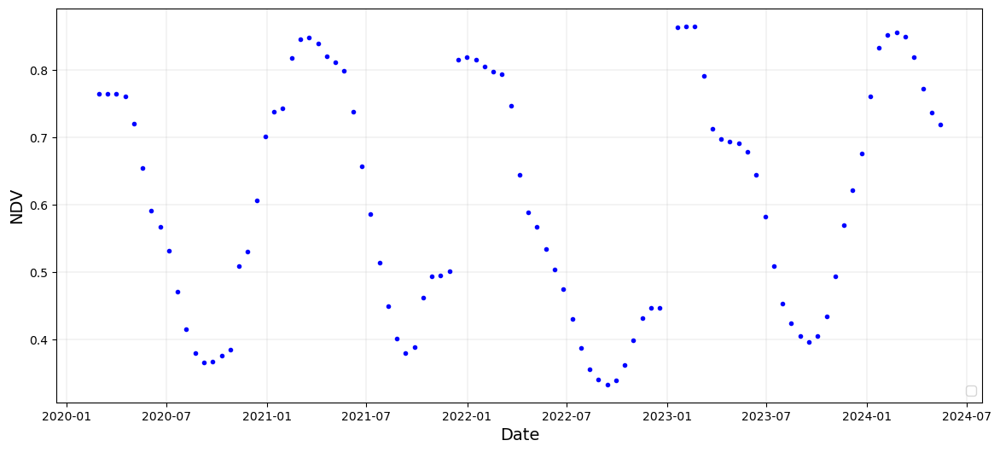

<Axes: xlabel='Date', ylabel='NDV'>

In [10]:
plot_getRegion(val_landsat_inter, yname='NDVI', style='.',  color="b")